# Udacity Project 4 Advanced Lane Finding

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd

#%matplotlib qt
%matplotlib inline

In [2]:
# Helper function to print two images side by side

def print_example_images(img, img_aug):
    plt.figure(figsize=(17,5))
    
    plt.subplot(121), plt.xticks([]), plt.yticks([])
    plt.imshow(img, cmap='gray')
        
    plt.subplot(122), plt.xticks([]), plt.yticks([])
    plt.imshow(img_aug, cmap='gray')
        
    plt.show()
    
    
def save_image(img, name):
    mpimg.imsave( "./output_images/"+ name + ".jpg", img)

In [3]:
# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
def get_camera_calibration_parameters(globdir='./camera_cal/calibration*.jpg'):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(globdir)

    # Step through the list and search for chessboard corners
    for fname in images:
        img = mpimg.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

    assert len(objpoints) == len(imgpoints) # Check if same number of object and image point found

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    return ret, mtx, dist

ret, mtx, dist = get_camera_calibration_parameters()



ym_per_pix = 12/202 # meters per pixel in y dimension
xm_per_pix = 3.7/300 # meters per pixel in x dimension

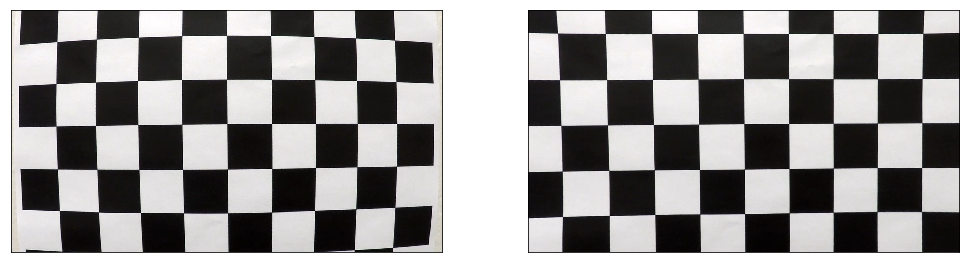

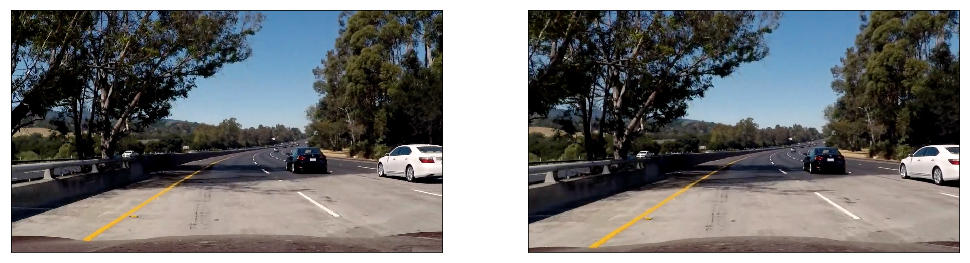

In [4]:
# Helper function: Undistort image
def undistort_img(img, mtx=mtx, dist=dist):
    return cv2.undistort(img, mtx, dist, None, mtx)


## undistortion Demo
img = mpimg.imread('./camera_cal/calibration1.jpg')
dst = undistort_img(img, mtx, dist)
print_example_images(img, dst)

img = mpimg.imread('./test_images/test5.jpg')
dst = undistort_img(img, mtx, dist)
print_example_images(img, dst)


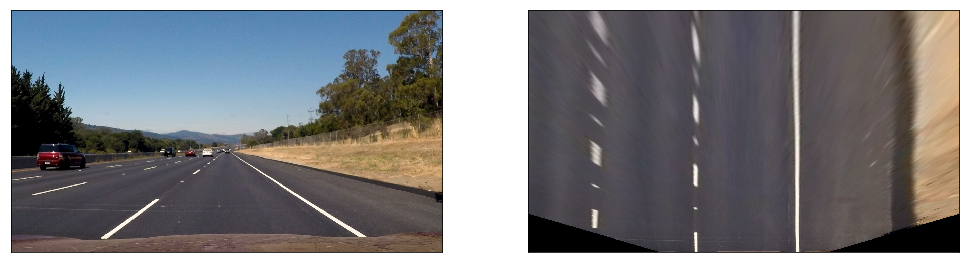

In [5]:
# define warp parameters for the perspective warp. Note that these parameters are found using straight_lines2.jpg.
def get_warp_parameters():
    """
    Helper function to calculate transformation matrix
    """
    src = np.float32(
        [(580, 450),
         (700, 450),
         (1130, 680),
         (150, 680)])

    dst = np.float32(
        [(450, 200),
         (830, 200),
         (830, 720),
         (450, 720)])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

M, Minv = get_warp_parameters()


def warp(img, M=M):
    """
    Helper function to apply perspective warp to an image
    """
    return cv2.warpPerspective(img, M, (1280,720), flags=cv2.INTER_LINEAR)


## Image warping demo
img = mpimg.imread('./test_images/straight_lines2.jpg')
warped = warp(img)
print_example_images(img, warped)

save_image(warped, "warped")

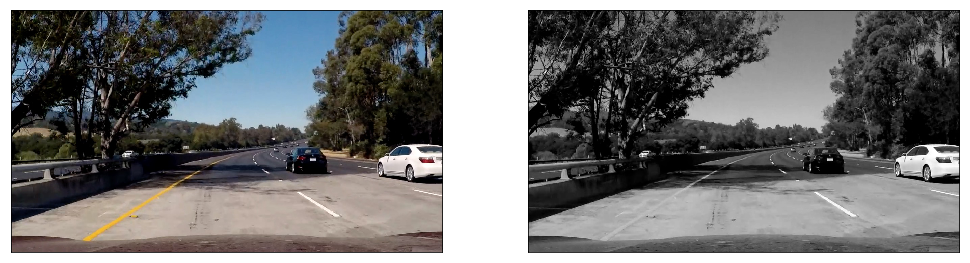

In [6]:
def get_grayscale(img):
    """
    Helper function to calculate the grayscale of an image
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).copy()
    return gray


# Grayscale demo
img = mpimg.imread('./test_images/test5.jpg')
gray = get_grayscale(img)
print_example_images(img, gray)

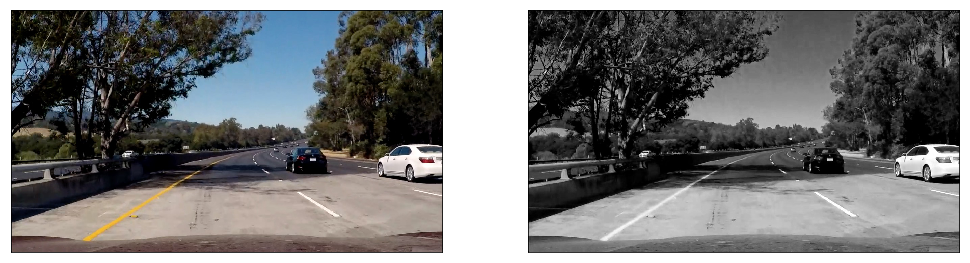

In [7]:
def get_redchannel(img):
    """
    Helper function to extract the R channel from RGB color space
    """
    red = img[:,:,0].copy() ## use red channel
    return red


# Demo
img = mpimg.imread('./test_images/test5.jpg')
red = get_redchannel(img)
print_example_images(img, red)

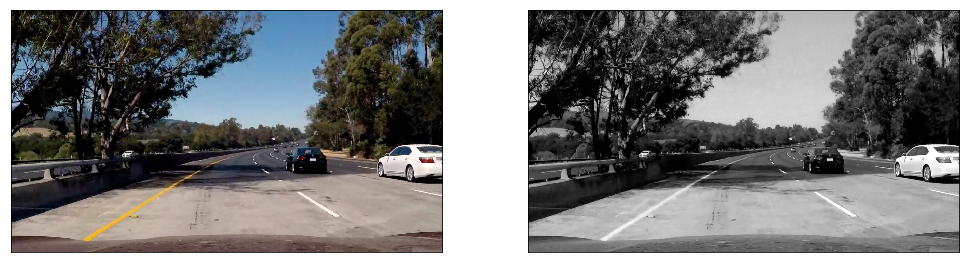

In [8]:
def get_s_chan(img):
    """
    Helper function to extract the S channel from HSV color space
    """
    s = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)[:,:,2].copy() ## use red channel
    return s


# Demo
img = mpimg.imread('./test_images/test5.jpg')
s = get_s_chan(img)
print_example_images(img, s)

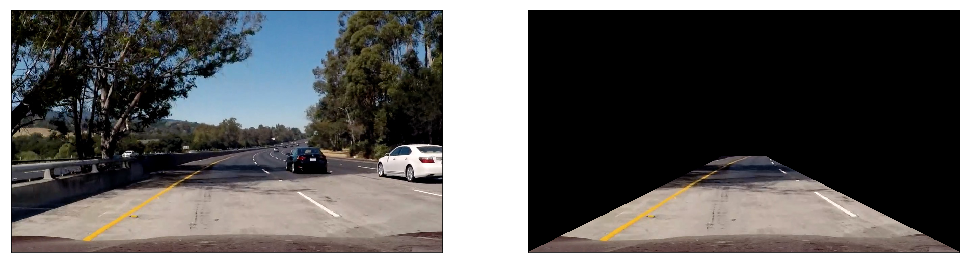

In [9]:
def mask_region_of_interest(img):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black. This can improve the performance of the thresholding.
    """
    # define vertices
    imshape = img.shape
    vertices = np.array([[(0,imshape[0]),(imshape[1]*.45, imshape[0]/1.65), 
                          (imshape[1]*.55, imshape[0]/1.65), (imshape[1],imshape[0])]], dtype=np.int32)
    
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


# Demo
img = mpimg.imread('./test_images/test5.jpg')
print_example_images(img, mask_region_of_interest(img))

### Thresholding

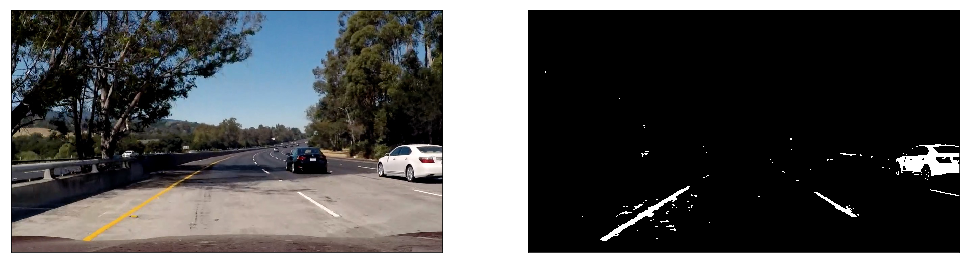

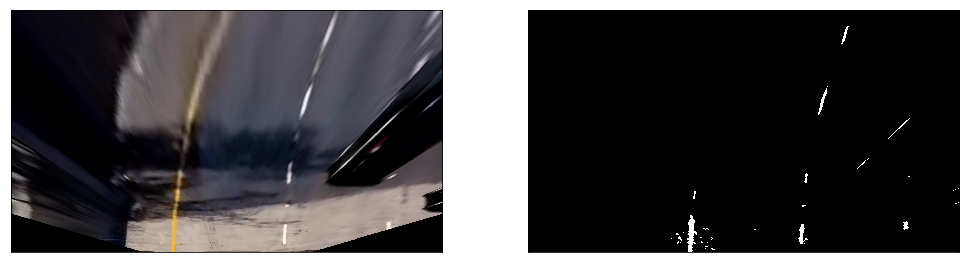

In [10]:
def apply_threshold(img, thresh=(0,255)):
    """
    Helper function to calculate a threshold of image. 
    
    The thresholding is static. The performance with changing lighting conditions is poor.
    """
    binary_output = np.zeros_like(img)
    binary_output[(img >= thresh[0]) & (img <= thresh[1])] = 1
    return binary_output


# Demo
img = mpimg.imread('./test_images/test5.jpg')
red = get_redchannel(img)
thresh = apply_threshold(red, thresh=(200, 255))

print_example_images(img, thresh)
print_example_images(warp(img), warp(thresh))

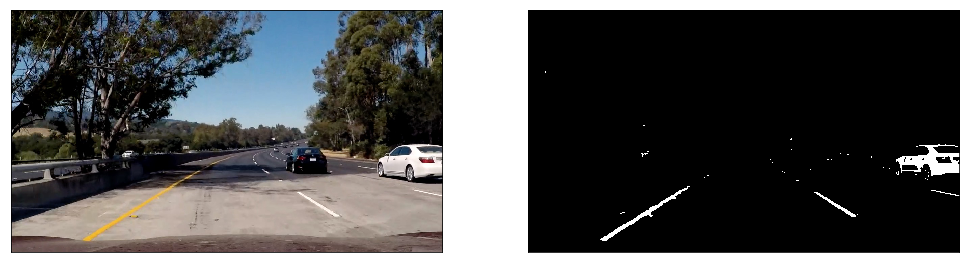

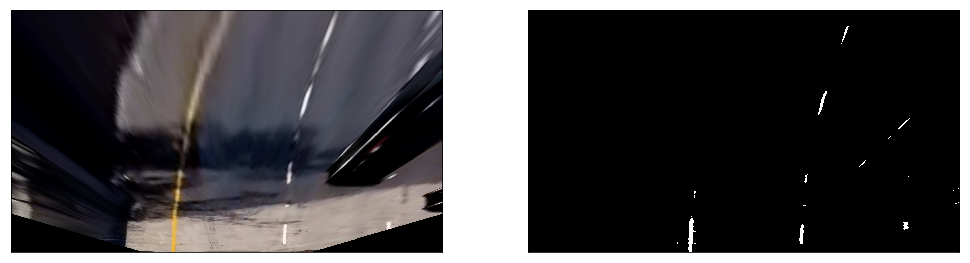

In [11]:
def apply_threshold_dynamic(img, percentile=0.03, only_lower_half=True):
    """
    Helper function to calculate dynamic threshold of image. 
    
    The thresholding takes a certain percentage of the brightest pixels in the lower half of the image.
    This improves the performance with changing lighting conditions.
    """
    binary_output = np.zeros_like(img)
    percentile = 100 - (percentile*100)
    if only_lower_half:
        lower_thresh = np.percentile(img[360:,:], percentile)      
    else:
        lower_thresh = np.percentile(img, percentile)
    
    binary_output[(img >= lower_thresh)] = 1
    
    return binary_output
 

# Demo
img = mpimg.imread('./test_images/test5.jpg')
red = get_redchannel(img)
thresh = apply_threshold_dynamic(red, percentile=0.03)

print_example_images(img, thresh)
print_example_images(warp(img), warp(thresh))

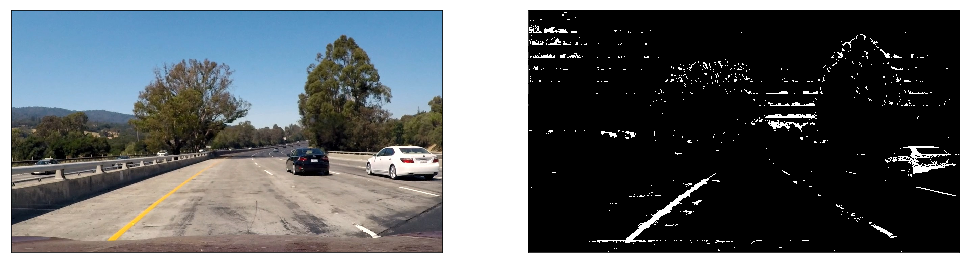

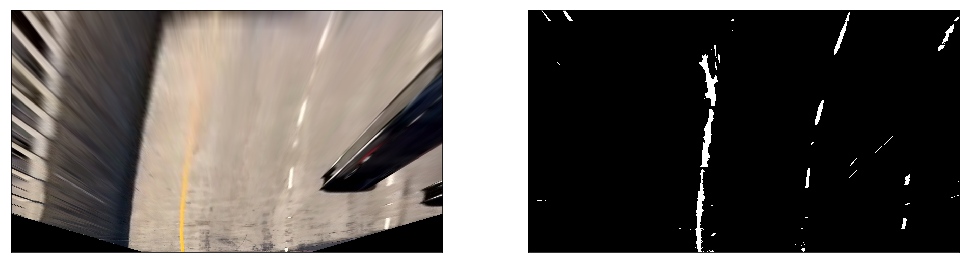

In [43]:
def apply_threshold_dynamic_sliding_window(img, percentile=0.015):
    """
    Slice the image in horizontal sections and do dynamic thresholding on each slice.
    
    This proved to be very good performing when used on an already perspective warped image.
    """
    binary_output = np.zeros_like(img)
    percentile = 100 - (percentile*100)
    
    nb_slice = 20 # number of slices to be used
    slice_height = np.int(img.shape[0]/nb_slice)
    
    # loop over slices and calculate dynamic threshold
    for n in range(nb_slice):
        slice_window = img[n*slice_height:(n+1)*slice_height, :]    
        lower_thresh = np.percentile(slice_window, percentile)
        binary_output[n*slice_height:(n+1)*slice_height, :][(slice_window >= lower_thresh)] = 1
    
    return binary_output
 

##demo
img = mpimg.imread('./test_images/test1.jpg')
red = get_redchannel(img)
warp_red = warp(red)

thresh = apply_threshold_dynamic_sliding_window(red, percentile=0.03)
warp_thresh = apply_threshold_dynamic_sliding_window(warp_red, percentile=0.015)

print_example_images(img, thresh)
print_example_images(warp(img), warp_thresh)


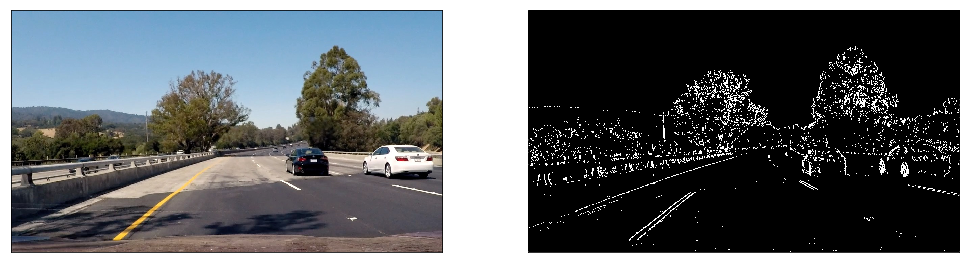

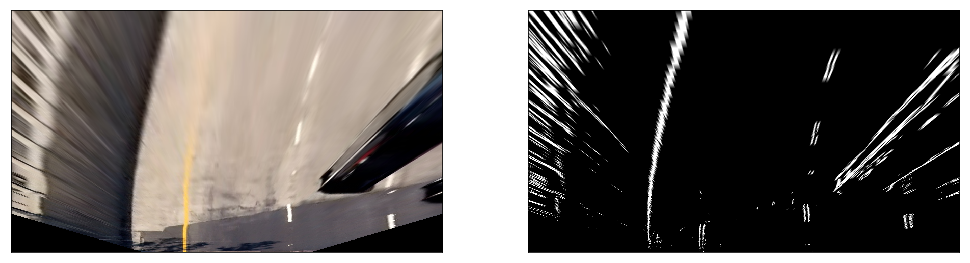

In [13]:
def apply_sobel_x_filter(img, thresh_abs_x = (0.01, 1)):
    """
    Apply sobel filter in x direction (vertical contrast borders). 
    Note that a Scharr kernel is used here for better performance.
    
    """
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=-1)
    
    # calculate value (sharpness) of contrast border
    abs_sobelx = np.absolute(sobelx)

    # threshold values 
    scaled_sobelx = abs_sobelx/np.max(abs_sobelx)
    binary_output_x = np.zeros_like(scaled_sobelx)
    binary_output_x[(scaled_sobelx >= thresh_abs_x[0]) & (scaled_sobelx <= thresh_abs_x[1])] = 1
    
    return binary_output_x


# Demo
img = mpimg.imread('./test_images/test4.jpg')
red = get_redchannel(img)
sobelx = apply_sobel_x_filter(red, thresh_abs_x = (0.1, 1))
print_example_images(img, sobelx)
print_example_images(warp(img), warp(sobelx))

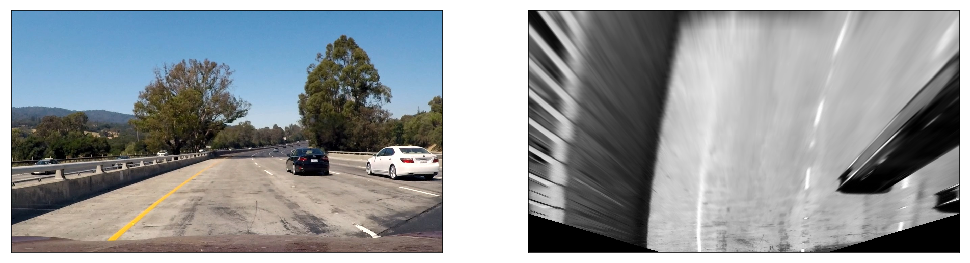

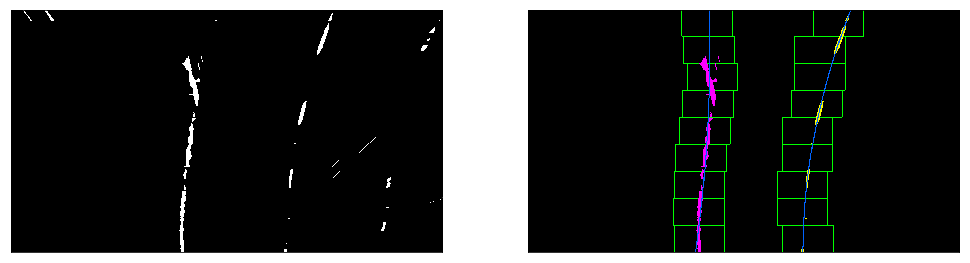

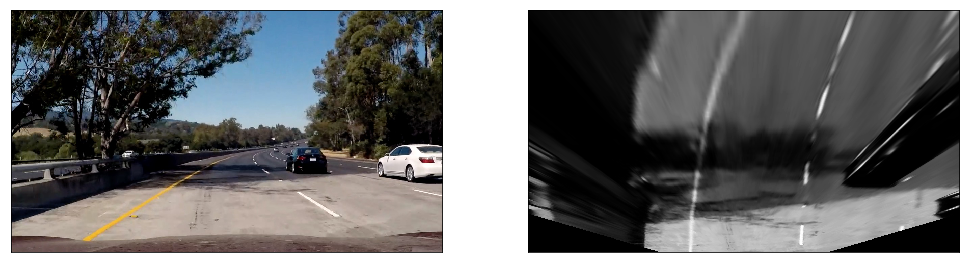

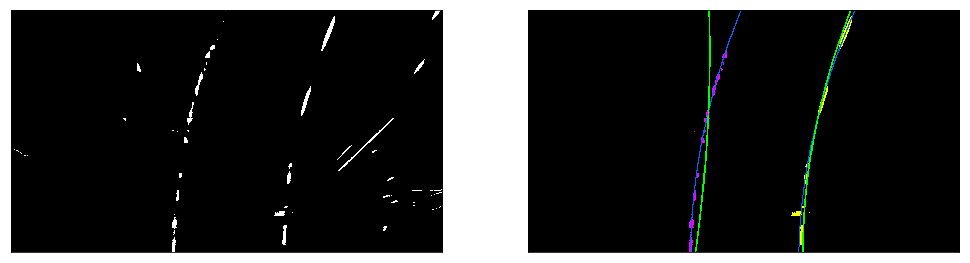

Left fit valid: False , right fit valid: True


In [14]:
class Line():
    """
    Class for the line detection, sanity check, smoothing and curvature calculation

    """
    def __init__(self, lane_line = 'left'):
        
        self.lane_line = lane_line
        
        # depending on the init parameters for the side of the line the starting point for the sliding window is set. 
        if self.lane_line == 'left':
            self.window_start = 350
            self.debug_color = [255, 0, 255]
        elif self.lane_line == 'right': 
            self.window_start = 640
            self.debug_color = [255, 255, 0]
        else:
            assert False
        
        
        self.nb_detected_lines = 0  # Number of previous frames with successfully detected lines. Bounded to 10
        self.fit_last = np.array([0.0, 0.0, 0.0]) # Last successful fit
        self.fit_pool = np.array([[],[]]) # Pool of last successful fits. Bounded to the last 10 fits
        self.fit_smooth = np.array([0.0, 0.0, 0.0]) # current smoothed fit - used for drawing lines
        self.fit_valid = False # Boolean if last lane detection was successful
        
        self.fit_cr_pool = np.array([[],[]]) # scaled fit pool - used for curvature calculation. Bounded to the last 10 fits
        self.curvature = 0 # current curvature of the lane line
        
        self.debug_out = [] # debug image
        
        
    def process_img(self, img):
        
        # assure that no color images are passed
        assert img.ndim == 2
        
        # if there are no prior lines detected, start sliding window algorithm
        if self.nb_detected_lines == 0:
            
            # discard oldest part of pool if there were several lines that didn't pass the sanity check
            self.fit_pool = self.fit_pool[3:,:]
            self.fit_cr_pool = self.fit_cr_pool[3:,:]
            
            # if there are fits left in the pool, update fit_smooth for use in later sanity check
            if self.fit_pool.size > 0:
                self.fit_smooth = np.mean(self.fit_pool, axis=0)            
            
            # Prepare sliding window algorithm for lane line finding. 
            # For left line calculate histogram on left half of the image, for right line on right half.
            histogram = np.sum(img[360:,self.window_start:self.window_start+290], axis=0)
            peak = np.argmax(histogram) + self.window_start
            
            # Do lane line finding with sliding window algorithm
            fit, fit_cr = self.__find_line_sliding_window(img, peak)
        
        # otherwise do simple line finding based on current average fit
        else:
            fit, fit_cr = self.__find_line_simple(img, self.fit_smooth)

        # Do sanity check on the newly found fit parameters. If they pass update parameters.
        if self.__sanitycheck_parameters(fit, fit_cr):     
            self.__update_parameters(fit, fit_cr)
        
    
    def __sanitycheck_parameters(self, fit, fit_cr): 
        # if fit pool is empty just save new fit, since we can't do any sanity checks
        if self.fit_pool.size == 0:
            self.nb_detected_lines = 1
            self.fit_valid = True
            return True
        
        # check if new fit in between +-30% of the current average fit
        diff = np.abs(fit - self.fit_smooth)
        if np.all(diff < np.abs(self.fit_smooth)*0.3):
            if self.nb_detected_lines < 10: # bound to 10
                self.nb_detected_lines += 1
            self.fit_valid = True
            return True
        
        else:
            if self.nb_detected_lines > 0:
                self.nb_detected_lines -= 1
            self.fit_valid = False
            return False
        
        assert False
        
        

    def __update_parameters(self, fit, fit_cr):
        # update parameters with new found, valid fit
        self.fit_last = fit
        
        # append new valid fit to pool
        if self.fit_pool.size == 0:
            self.fit_pool = fit
            self.fit_pool = np.reshape(self.fit_pool, (1,3))
        else:
            self.fit_pool = np.vstack((self.fit_pool, fit))
            # only keep the last 10 fits
            if self.fit_pool.shape[0] > 10: 
                self.fit_pool = self.fit_pool[1:,:]
       
        # average over last fits
        self.fit_smooth = np.mean(self.fit_pool, axis=0)
        
        # same for the scaled fit
        if self.fit_cr_pool.size == 0:
            self.fit_cr_pool = fit_cr
            self.fit_cr_pool = np.reshape(self.fit_cr_pool, (1,3))
        else:
            self.fit_cr_pool = np.vstack((self.fit_cr_pool, fit_cr))
            if self.fit_cr_pool.shape[0] > 10:
                self.fit_cr_pool = self.fit_cr_pool[1:,:]        
        
        # calculate lane line curvature
        y_eval = img.shape[0]
        self.curvature = ((1 + (2*np.mean(self.fit_cr_pool[:,0])*y_eval*ym_per_pix 
                                + np.mean(self.fit_cr_pool[:,1]))**2)**1.5) / np.abs(2*np.mean(self.fit_cr_pool[:,0]))
        
      
    def __find_line_sliding_window(self, img, peak):
        nwindows = 9
        window_height = np.int(img.shape[0]/nwindows)
        margin = 75
        nb_pixel_to_adjust_window_pos = 50 # number of pixels to adjust position of window
        lane_coordx = np.array([])
        lane_coordy = np.array([])
    
        ## create debug output for sliding window 
        self.debug_out = np.zeros_like(img)
        self.debug_out = np.dstack((self.debug_out, self.debug_out, self.debug_out))
        
        for n in range(nwindows):
            # slice image into horizontal slice
            window_lower_border = img.shape[0] - n*window_height
            window_slice = img[window_lower_border-window_height:window_lower_border, :]

            # find all white pixels within margin of peak
            slice_window = window_slice[: , peak-margin:peak+margin]
            slice_line_coordy, slice_line_coordx = np.nonzero(slice_window)
            # compensate offset of coordinates 
            slice_line_coordy += window_lower_border - window_height
            slice_line_coordx += peak - margin
            
            # append found pixels
            lane_coordx = np.append(lane_coordx, slice_line_coordx)
            lane_coordy = np.append(lane_coordy, slice_line_coordy)
            
            # draw sliding window into debug output
            cv2.rectangle(self.debug_out,(peak-margin,window_lower_border-window_height),(peak+margin,window_lower_border),(0,255,0), 2)
            
            # recenter window if more than (adjust_window_pos) pixel are found
            if slice_line_coordx.size > nb_pixel_to_adjust_window_pos:
                peak = np.int(np.mean(slice_line_coordx))

        # calculate fit and scaled fit
        fit_cr = np.polyfit(lane_coordy*ym_per_pix, lane_coordx*xm_per_pix, 2)
        fit = np.polyfit(lane_coordy, lane_coordx, 2)
        
        # mark pixels that contributed to fit in debug output 
        self.debug_out[lane_coordy.astype(int), lane_coordx.astype(int)] = self.debug_color
        
        # draw fitted line into debug output
        ploty = np.linspace(0, 719, num=720)
        
        fitx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([fitx, ploty]))])
        # Draw the lane onto the warped blank image
        cv2.polylines(self.debug_out, np.int32([pts_left]), isClosed=False, color=(0,100,255), thickness=2)
        
        
        return fit, fit_cr 
    
    
    def __find_line_simple(self, img, fit_old):
        margin = 50
        lane_coordx = np.array([])
        lane_coordy = np.array([])
        
        ## create debug output for sliding window 
        self.debug_out = np.zeros_like(img)
        self.debug_out = np.dstack((self.debug_out, self.debug_out, self.debug_out))
        
        # find all white pixels in image
        px_line_coordy, px_line_coordx = np.nonzero(img)
        px_line_coord = np.transpose(np.asarray(np.nonzero(img)))
        
        # find all white pixels within margin from last fit
        test = fit_old[0]*(px_line_coord[:,0]**2) + fit_old[1]*px_line_coord[:,0] + fit_old [2]
        lane_coord = px_line_coord[((test+margin) > px_line_coord[:,1]) & ((test-margin) < px_line_coord[:,1])]
        
        lane_coordy = lane_coord[:,0]
        lane_coordx = lane_coord[:,1]
        
        # calculate fit and scaled fit 
        fit_cr = np.polyfit(lane_coordy*ym_per_pix, lane_coordx*xm_per_pix, 2)
        fit = np.polyfit(lane_coordy, lane_coordx, 2)
        
        # mark pixels that contributed to fit in debug output 
        self.debug_out[lane_coordy.astype(int), lane_coordx.astype(int)] = self.debug_color
        
        ploty = np.linspace(0, 719, num=720)
        
        fitx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([fitx, ploty]))])
        # Draw the lane onto the warped blank image
        cv2.polylines(self.debug_out, np.int32([pts_left]), isClosed=False, color=(0,100,255), thickness=2)
        
        fitoldx = fit_old[0]*ploty**2 + fit_old[1]*ploty + fit_old[2]
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_old_left = np.array([np.transpose(np.vstack([fitoldx, ploty]))])
        # Draw the lane onto the warped blank image
        cv2.polylines(self.debug_out, np.int32([pts_old_left]), isClosed=False, color=(0,255,0), thickness=4)

        return fit, fit_cr 
                
                
## Demo         
left = Line('left')
right = Line('right')

# first image, sliding window algorithm should be used
img = mpimg.imread('./test_images/test1.jpg')
undist = undistort_img(img, mtx, dist)
red_chan = get_redchannel(undist)
bird_warp = warp(red_chan)
thresh_bird_warp = apply_threshold_dynamic_sliding_window(bird_warp, percentile=0.01)

left.process_img(thresh_bird_warp)
right.process_img(thresh_bird_warp)

print_example_images(img, bird_warp)
print_example_images(thresh_bird_warp, right.debug_out + left.debug_out)


# second image, simple line finding should be used
img = mpimg.imread('./test_images/test5.jpg')
undist = undistort_img(img, mtx, dist)
red_chan = get_redchannel(undist)
bird_warp = warp(red_chan)
thresh_bird_warp = apply_threshold_dynamic_sliding_window(bird_warp, percentile=0.01)

left.process_img(thresh_bird_warp)
right.process_img(thresh_bird_warp)

print_example_images(img, bird_warp)
print_example_images(thresh_bird_warp, right.debug_out + left.debug_out)
print('Left fit valid:',left.fit_valid, ', right fit valid:', right.fit_valid)


In [15]:
## Offset

def calculate_offset(left_fit, right_fit):
    y= 720
    xl = left_fit[0]* y**2 + left_fit[1]*y + left_fit[2]  
    xr = right_fit[0]* y**2 + right_fit[1]*y + right_fit[2]

    car_position = img.shape[1]/2
    lane_center_position = (xr + xl)/2
    offset_lane = (car_position - lane_center_position)*xm_per_pix
    return offset_lane

#Demo
offset_lane = calculate_offset(left.fit_smooth, right.fit_smooth)
print('Offset from middle of the lane: ', offset_lane*100, 'cm')

Offset from middle of the lane:  -15.6726448237 cm


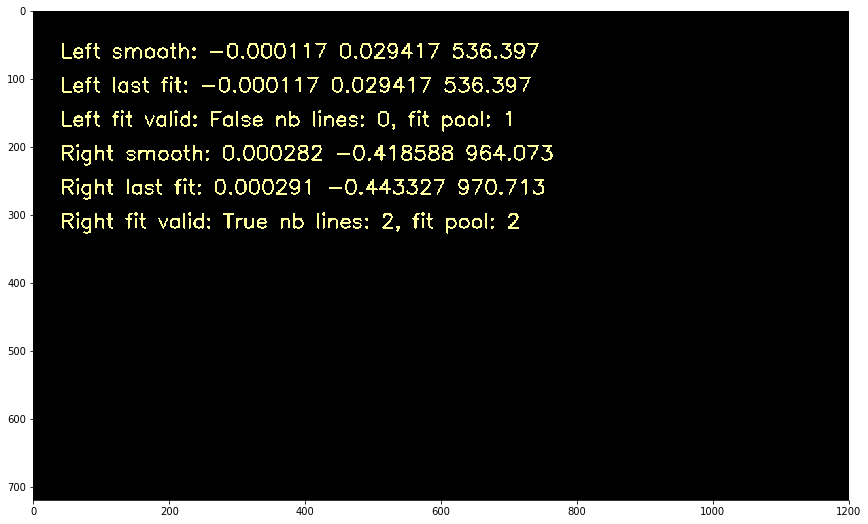

In [16]:
## Draw Debug Text on image 
def draw_debug_text(img):
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Left smooth: ' + str('{:.6f}'.format(left.fit_smooth[0])) + ' ' + str('{:.6f}'.format(left.fit_smooth[1])) + ' ' + str('{:.3f}'.format(left.fit_smooth[2]))
    cv2.putText(img,text, (40,70), font, 1, (255,255,155),2)
    text = 'Left last fit: ' + str('{:.6f}'.format(left.fit_last[0])) + ' ' + str('{:.6f}'.format(left.fit_last[1])) + ' ' + str('{:.3f}'.format(left.fit_last[2]))
    cv2.putText(img,text, (40,120), font, 1, (255,255,155),2)
    text = 'Left fit valid: '+ str(left.fit_valid) + ' nb lines: ' + str(left.nb_detected_lines) + ', fit pool: ' + str(left.fit_pool.shape[0]) 
    cv2.putText(img,text, (40,170), font, 1, (255,255,155),2)

    text = 'Right smooth: ' + str('{:.6f}'.format(right.fit_smooth[0])) + ' ' + str('{:.6f}'.format(right.fit_smooth[1])) + ' ' + str('{:.3f}'.format(right.fit_smooth[2]))
    cv2.putText(img,text, (40,220), font, 1, (255,255,155),2)
    text = 'Right last fit: ' + str('{:.6f}'.format(right.fit_last[0])) + ' ' + str('{:.6f}'.format(right.fit_last[1])) + ' ' + str('{:.3f}'.format(right.fit_last[2]))
    cv2.putText(img,text, (40,270), font, 1, (255,255,155),2)
    text = 'Right fit valid: '+ str(right.fit_valid) + ' nb lines: ' + str(right.nb_detected_lines) + ', fit pool: ' + str(right.fit_pool.shape[0]) 
    cv2.putText(img,text, (40,320), font, 1, (255,255,155),2)  

    return img
    
##Demo
blank = np.full((720,1200,3),0, dtype='uint8')
debug = draw_debug_text(blank)
plt.figure(figsize=(17,9))
plt.imshow(debug, cmap='gray')

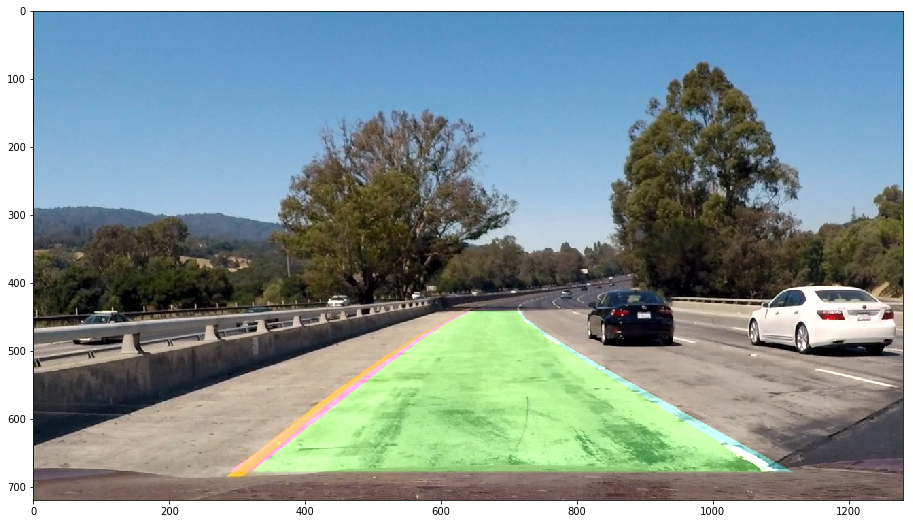

In [28]:
## Draw line

def draw_on_image(img, left_fit, right_fit):
    
    ploty = np.linspace(0, 719, num=720)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    warp_zero = np.zeros(img.shape[0:2]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=12)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=12)
        
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    return result, color_warp, newwarp
    
    

## Demo
img = mpimg.imread('./test_images/test1.jpg')
result, color_warp, newwarp = draw_on_image(img, left.fit_smooth, right.fit_smooth)
plt.figure(figsize=(17,9))
plt.imshow(result)

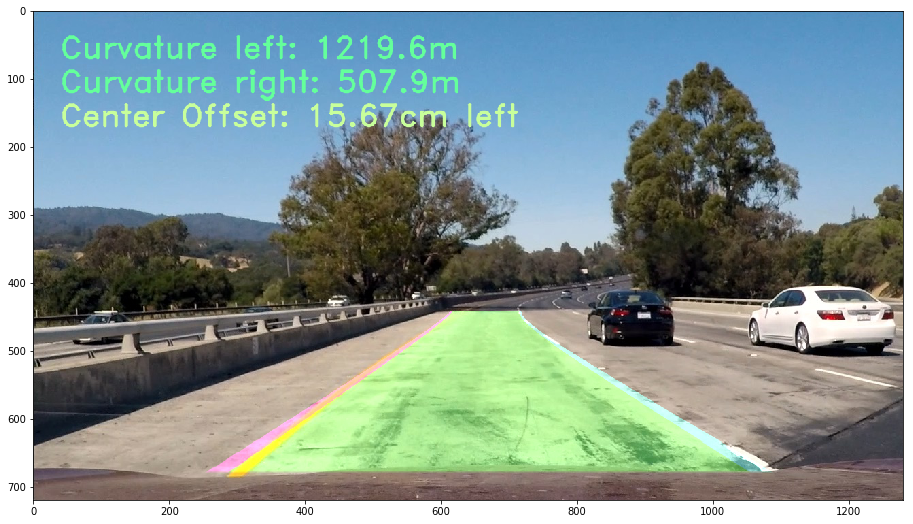

In [18]:
## Draw Text on image
def draw_text(img, left_curvature, right_curvature, offset):
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curvature left: ' + '{:04.1f}'.format(left_curvature) + 'm'
    cv2.putText(img,text, (40,70), font, 1.5, (100,255,155), 2, cv2.LINE_AA)
    text = 'Curvature right: ' + '{:04.1f}'.format(right_curvature) + 'm'
    cv2.putText(img,text, (40,120), font, 1.5, (100,255,155), 2, cv2.LINE_AA)
        
    if offset > 0:
        offset_side = 'right'
    elif offset <= 0:
        offset_side = 'left'
    offset = abs(offset)
    
    text = 'Center Offset: {:02.2f}'.format(offset*100) + 'cm ' + offset_side
    cv2.putText(img,text, (40,170), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    return img
    
##Demo
result = draw_text(result, left.curvature, right.curvature, offset_lane)
plt.figure(figsize=(17,9))
plt.imshow(result)

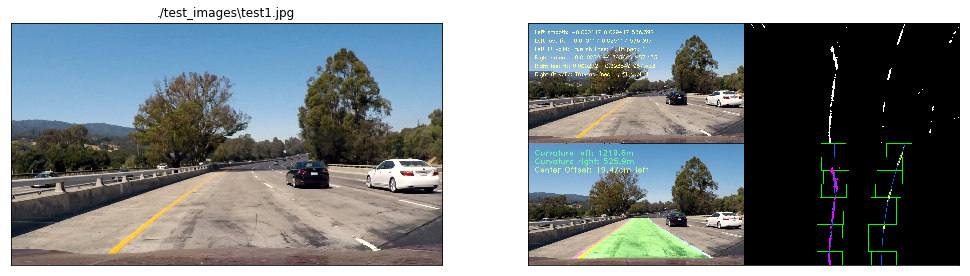

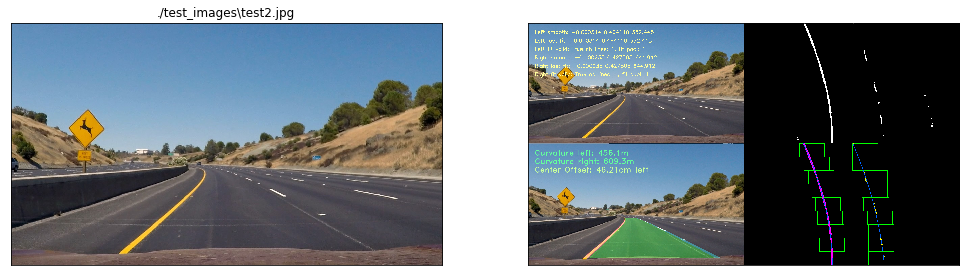

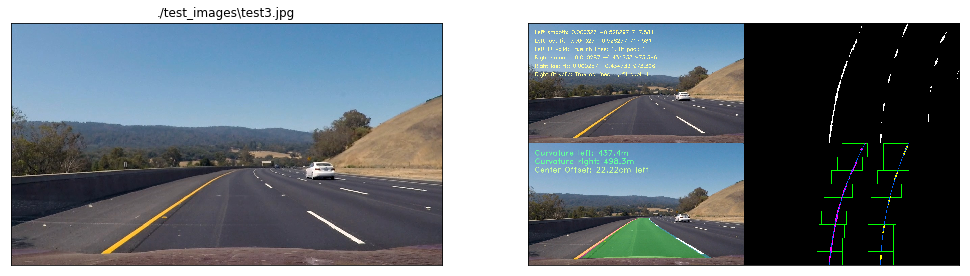

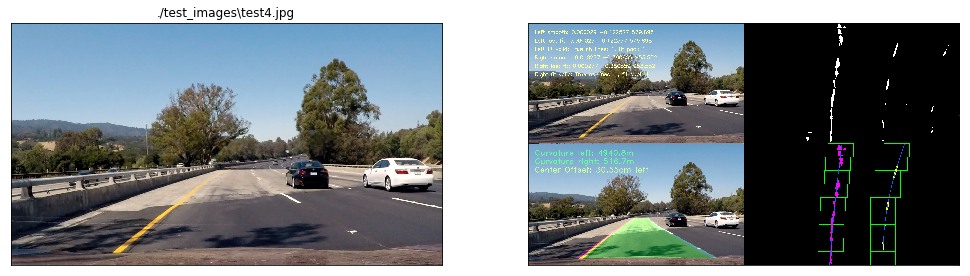

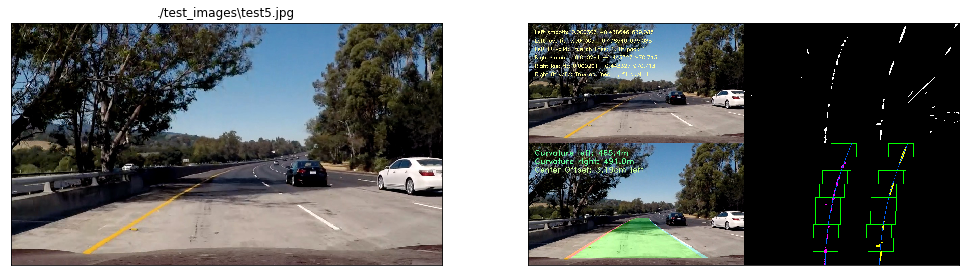

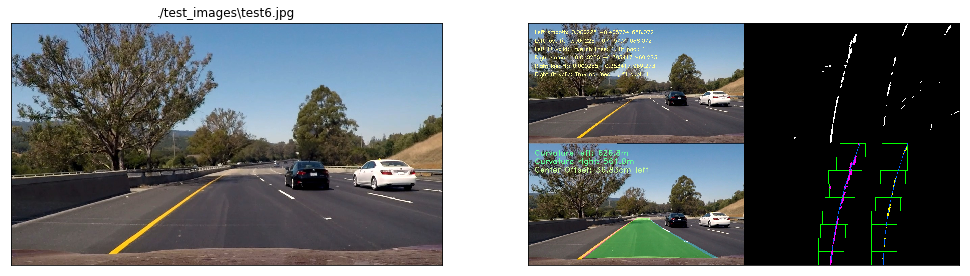

In [33]:
# define pipeline for lane detection
def pipeline_advanced_lane_finding(img, debug=False):
    
    # 1. undistort image
    undist = undistort_img(img, mtx, dist)
    
    # 2. get red channel
    red_chan = get_redchannel(undist)
    
    # 3. perspective transform image
    warp_masked_red = warp(red_chan)
    
    # 4. apply sliding window dynamic threshold
    thresh_warp = apply_threshold_dynamic_sliding_window(warp_masked_red, percentile=0.01)
    
    combined = np.zeros_like(thresh_warp)
    combined[(thresh_warp == 1)] = 1 
    
    # 5. find left and right lane line and calculate curvature
    left.process_img(combined)
    right.process_img(combined)
    
    # 6. calculate offset from middle of lane
    offset_lane = calculate_offset(left.fit_smooth, right.fit_smooth)
    
    # 7. draw lines, curvature and offset to input image
    result, color_warp, newwarp  = draw_on_image(img, left.fit_smooth, right.fit_smooth)
    result = draw_text(result, left.curvature, right.curvature, offset_lane)
    
    # if debug flag it True, add debugging information
    if debug == True:
        draw_debug_text(img) # draw debug on input image
        result = np.vstack((img, result)) # put input image and resulting image on top of each other
        
        debug_out = left.debug_out + right.debug_out # combine debug output from left and right
        
        combined = np.dstack((combined, combined, combined))*255 
        debug_out = np.vstack((combined, debug_out)) # put threshold and debug output on top of each other
        
        result = np.hstack((result, debug_out)) # combine all four images into one
    
    return result


# Demo. Print all test images and how the pipeline works
images = glob.glob('./test_images/test*')

for n, filename in enumerate(images):
    img = mpimg.imread(filename)
    plt.figure(figsize=(17,5))
    plt.subplot(1, 2, 1), plt.xticks([]), plt.yticks([])
    plt.title(filename)
    plt.imshow(img)
    left = Line('left')
    right = Line('right')
    dst = pipeline_advanced_lane_finding(img, debug=True)
    plt.subplot(1, 2, 2), plt.xticks([]), plt.yticks([])
    plt.imshow(dst, cmap='gray')


# Video

In [23]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [24]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)

    return pipeline_advanced_lane_finding(image, debug=True)

In [25]:
project_output = 'project_video_output_debug.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
left = Line('left')
right = Line('right')
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_video_output_debug.mp4
[MoviePy] Writing video project_video_output_debug.mp4


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:32<00:00,  8.57it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_debug.mp4 

Wall time: 2min 34s


# Challenge Video

In [ ]:
project_output = 'challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
left = Line('left')
right = Line('right')
clip1 = VideoFileClip("challenge_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

# Harder Challenge Video

In [ ]:
project_output = 'harder_challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
left = Line('left')
right = Line('right')
clip1 = VideoFileClip("harder_challenge_video.mp4")
project_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

# Backup

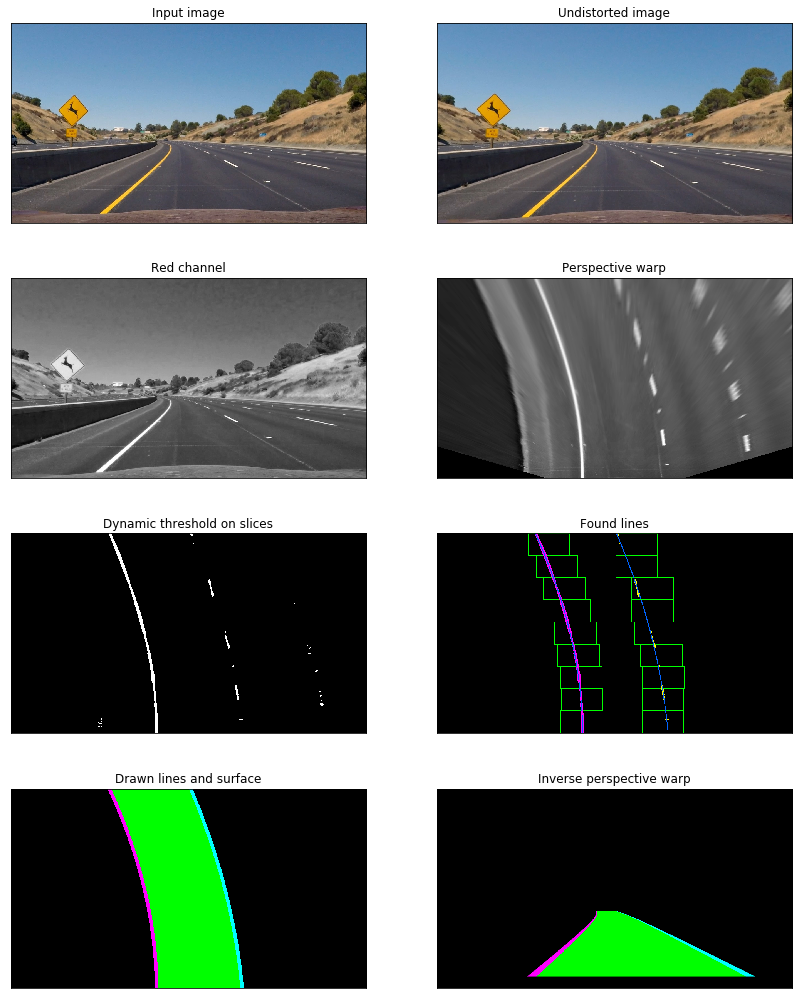

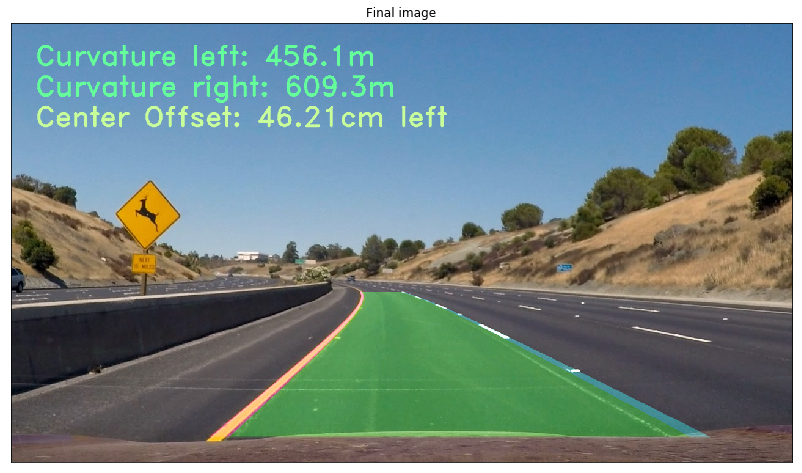

In [32]:
## create pipeline visualization

left = Line('left')
right = Line('right')

img = mpimg.imread('./test_images/test2.jpg')
undist = undistort_img(img, mtx, dist)
# 2. get red channel
red_chan = get_redchannel(undist)

# 4. perspective transform image
warp_red = warp(red_chan)

# 5. apply sliding window dynamic threshold
thresh_warp = apply_threshold_dynamic_sliding_window(warp_red, percentile=0.01)

combined = np.zeros_like(thresh_warp)
combined[(thresh_warp == 1)] = 1 

# 6. find left and right lane line and calculate curvature
left.process_img(combined)
right.process_img(combined)

# 7. calculate offset from middle of lane
offset_lane = calculate_offset(left.fit_smooth, right.fit_smooth)

# 8. draw lines, curvature and offset to input image
result, color_warp, newwarp = draw_on_image(img, left.fit_smooth, right.fit_smooth)
result = draw_text(result, left.curvature, right.curvature, offset_lane)



plt.figure(figsize=(14,18))
    
plt.subplot(421)
plt.title("Input image")
plt.xticks([]), plt.yticks([])
plt.imshow(img)

plt.subplot(422)
plt.title("Undistorted image")
plt.xticks([]), plt.yticks([])
plt.imshow(undist, cmap='gray')

plt.subplot(423)
plt.title("Red channel")
plt.xticks([]), plt.yticks([])
plt.imshow(red_chan, cmap='gray')

plt.subplot(424)
plt.title("Perspective warp")
plt.xticks([]), plt.yticks([])
plt.imshow(warp_red, cmap='gray')

plt.subplot(425)
plt.title("Dynamic threshold on slices")
plt.xticks([]), plt.yticks([])
plt.imshow(thresh_warp, cmap='gray')

plt.subplot(426)
plt.title("Found lines")
plt.xticks([]), plt.yticks([])
plt.imshow(left.debug_out + right.debug_out)

plt.subplot(427)
plt.title("Drawn lines and surface")
plt.xticks([]), plt.yticks([])
plt.imshow(color_warp)

plt.subplot(428)
plt.title("Inverse perspective warp")
plt.xticks([]), plt.yticks([])
plt.imshow(newwarp)

plt.show()

plt.figure(figsize=(14,9))
plt.title("Final image")
plt.xticks([]), plt.yticks([])
plt.imshow(result)
plt.show()

In [ ]:
def sobel_parameters(img, 
                     thresh_abs_x = (0.01, 1), 
                     thresh_abs_y = (0.01, 1), 
                     thresh_mag = (0.05, 1), 
                     thresh_dir = (0, 1)):
    
    # vertical contrast borders. Note that a Scharr kernel is used here for better performance 
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=-1)
    
    # horizontal contrast borders. Scharr kernel
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=-1)
    
    # diagonal contrast borders high->low. Scharr kernel
    kernel10 = np.array([[0, -3, -10],[3, 0, -3],[10, 3, 0]]) 
    sobel10 = cv2.filter2D(img, -1, kernel10)
    
    # diagonal contrast borders low->high. Scharr kernel
    kernel01 = np.array([[10, 3, 0],[3, 0, -3],[0, -3, -10]]) 
    sobel01 = cv2.filter2D(img, -1, kernel01)
     
    # calculate value (sharpness) of contrast border and apply threshold to it
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # threshold values 
    scaled_sobelx = abs_sobelx/np.max(abs_sobelx)
    binary_output_x = np.zeros_like(scaled_sobelx)
    binary_output_x[(scaled_sobelx >= thresh_abs_x[0]) & (scaled_sobelx <= thresh_abs_x[1])] = 1
    
    scaled_sobely = abs_sobely/np.max(abs_sobely)
    binary_output_y = np.zeros_like(scaled_sobely)
    binary_output_y[(scaled_sobely >= thresh_abs_y[0]) & (scaled_sobely <= thresh_abs_y[1])] = 1
    
    mag = np.sqrt(sobelx**2 + sobely**2)
    scaled_mag = mag/np.max(mag)
    binary_output_mag = np.zeros_like(scaled_mag)
    binary_output_mag[(scaled_mag >= thresh_mag[0]) & (scaled_mag <= thresh_mag[1])] = 1
    
    dir_grad = np.arctan2(abs_sobely, abs_sobelx)
    binary_output_dir = np.zeros_like(dir_grad)
    binary_output_dir[(dir_grad > thresh_dir[0]) & (dir_grad <= thresh_dir[1])] = 1
    
    # put all binary images into one big numpy array
    bin_out = img.copy()
    bin_out = np.dstack((bin_out, binary_output_x))
    bin_out = np.dstack((bin_out, binary_output_y))
    bin_out = np.dstack((bin_out, binary_output_mag))
    bin_out = np.dstack((bin_out, binary_output_dir))
    
    dir_mag = np.zeros_like(binary_output_dir)
    dir_mag[(bin_out[:,:,3] == 1) & (bin_out[:,:,4] == 1)] = 1
    bin_out = np.dstack((bin_out, dir_mag))
    
    combined = np.zeros_like(binary_output_dir)
    combined[(bin_out[:,:,1] == 1) & (bin_out[:,:,2] == 1) & (bin_out[:,:,3] == 1) & (bin_out[:,:,4] == 1)] = 1
    bin_out = np.dstack((bin_out, combined))
    
    
    return bin_out

## Interactive sobel parameter widget

In [ ]:
from IPython.html.widgets import *


def sobel(thresh_abs_x_low = 0.1, thresh_abs_x_high = 1,
         thresh_abs_y_low = 0, thresh_abs_y_high = 1, 
         thresh_mag_low = 0, thresh_mag_high = 1,
         thresh_dir_low = 0, thresh_dir_high=0.67):
    
    
    img = mpimg.imread('./test_images/test1.jpg')
    gray = get_redchannel(img)
    birdview = warp(gray)
    bin_out = sobel_parameters(birdview, 
                               thresh_abs_x = (thresh_abs_x_low, thresh_abs_x_high), 
                                thresh_abs_y = (thresh_abs_y_low, thresh_abs_y_high), 
                                thresh_mag = (thresh_mag_low, thresh_mag_high), 
                                thresh_dir = (thresh_dir_low, thresh_dir_high))
    
    plt.figure(figsize=(17,10))
    #out = np.dstack((bin_out[:,:,1], bin_out[:,:,2], bin_out[:,:,5]))
    plt.imshow(bin_out[:,:,6], cmap='gray')
    plt.show()
    return

interact(sobel, thresh_abs_x_low = (0,1,0.01), thresh_abs_x_high = (0,1,0.01),
         thresh_abs_y_low = (0,1,0.01), thresh_abs_y_high = (0,1,0.01), 
         thresh_mag_low = (0,1,0.01), thresh_mag_high = (0,1,0.01),
         thresh_dir_low = (0,1.57,0.01), thresh_dir_high= (0,1.57,0.01))